# Project Understanding
This project is a multi classification problem for classify species of butterfly or moth species. There are 100 classes of species that we will classify such as ADONIS, AMERICAN SNOOT, and 98 more.

For this project we will use 2 CNN tranfer learning model such as Efficientnetb3 and Resnet50. The reason we will use these models because of efficiently computational resource and performance that these model offer.

# Import Libraries

In [2]:
import zipfile, os
os.environ["TF_GPU_THREAD_MODE"] = "gpu_private"
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

from keras.preprocessing import image

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from keras import optimizers, applications
from tensorflow.keras.layers import Dense, MaxPool2D, Conv2D, Dropout, Flatten
from tensorflow.keras.models import Sequential

# Load Data

In [2]:
df = pd.read_csv('dataset/butterflies and moths.csv')

In [3]:
df_train = df[df['data set'] == 'train']
df_test = df[df['data set'] == 'test']
df_val = df[df['data set'] == 'valid']


In [4]:
df_count_train = df_train['class id'].value_counts().reset_index()
df_count_test = df_test['class id'].value_counts().reset_index()
df_count_val = df_val['class id'].value_counts().reset_index()


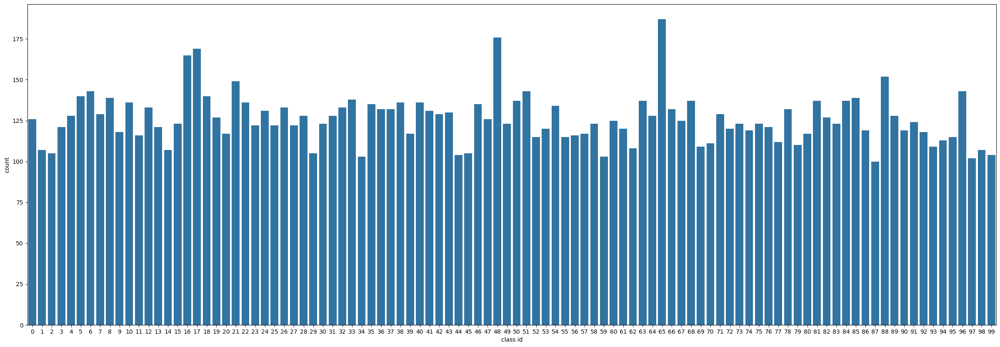

In [5]:
plt.figure(figsize=(30,10))
sns.barplot(data=df_count_train, x='class id', y='count')
plt.show()

In [6]:
ADONIS_dir = os.path.join('dataset/train/ADONIS')
AFRICAN_GIANT_SWALLOWTAIL_dir = os.path.join('dataset/train/AFRICAN GIANT SWALLOWTAIL')
AMERICAN_SNOOT_dir = os.path.join('dataset/train/AMERICAN SNOOT')
AN_88_dir = os.path.join('dataset/train/AN 88')

In [7]:
ADONIS_files = os.listdir(ADONIS_dir)
AFRICAN_GIANT_SWALLOWTAIL_files = os.listdir(AFRICAN_GIANT_SWALLOWTAIL_dir)
AMERICAN_SNOOT_files = os.listdir(AMERICAN_SNOOT_dir)
AN_88_files = os.listdir(AN_88_dir)

In [8]:
print('Total ADONIS images :', len(ADONIS_files))
print('Total AFRICAN GIANT SWALLOWTAIL images :', len(AFRICAN_GIANT_SWALLOWTAIL_files))
print('Total AMERICAN SNOOT images :', len(AMERICAN_SNOOT_files))
print('Total AN 88 images :', len(AN_88_files))

Total ADONIS images : 126
Total AFRICAN GIANT SWALLOWTAIL images : 107
Total AMERICAN SNOOT images : 105
Total AN 88 images : 121


In [9]:
nrows = 5
ncols = 5

# Index for iterating over images
pic_index = 0

In [10]:
# Set up matplotlib fig

pic_index += 5

next_ADONIS_pix = [os.path.join(ADONIS_dir, fname)
                for fname in ADONIS_files[pic_index-5:pic_index]]
next_AFRICAN_GIANT_SWALLOWTAIL_pix = [os.path.join(AFRICAN_GIANT_SWALLOWTAIL_dir, fname)
                for fname in AFRICAN_GIANT_SWALLOWTAIL_files[pic_index-5:pic_index]]
next_AMERICAN_SNOOT_pix = [os.path.join(AMERICAN_SNOOT_dir, fname)
                for fname in AMERICAN_SNOOT_files[pic_index-5:pic_index]]
next_AN_88_pix = [os.path.join(AN_88_dir, fname)
                for fname in AN_88_files[pic_index-5:pic_index]]

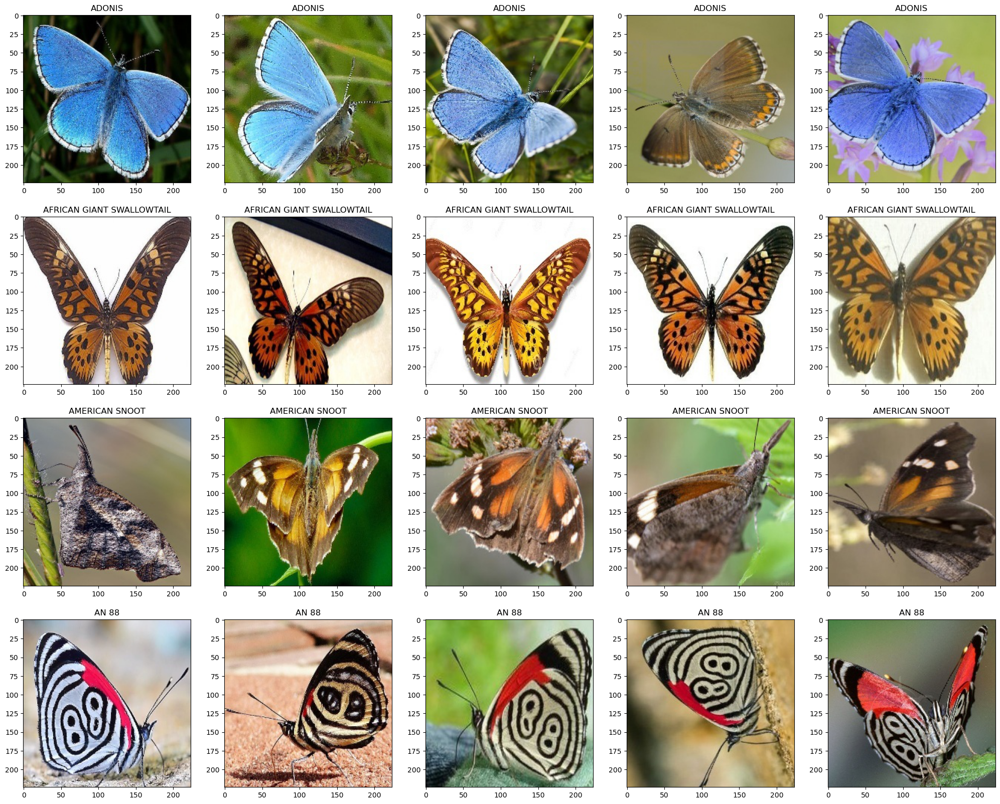

In [11]:
fig, axes = plt.subplots(4,5, figsize=(25,20))
row = 0
col1 = 0
col2 = 0
col3 = 0
col4 = 0
for i, img_path in enumerate(next_ADONIS_pix+next_AFRICAN_GIANT_SWALLOWTAIL_pix+next_AMERICAN_SNOOT_pix+next_AN_88_pix):
    if i < 5:
        img = mpimg.imread(img_path)
        axes[row][col1].imshow(img)
        axes[row][col1].set_title('ADONIS')
        col1+=1
    elif i < 10 and i >= 5:
        row=1
        img = mpimg.imread(img_path)
        axes[row][col2].imshow(img)
        axes[row][col2].set_title('AFRICAN GIANT SWALLOWTAIL')
        col2+=1
    elif i < 15 and i >= 10:
        row=2
        img = mpimg.imread(img_path)
        axes[row][col3].imshow(img)
        axes[row][col3].set_title('AMERICAN SNOOT')
        col3+=1
    elif i < 20 and i >= 15:
        row=3
        img = mpimg.imread(img_path)
        axes[row][col4].imshow(img)
        axes[row][col4].set_title('AN 88')
        col4+=1

# Data Augmentation

In [5]:
datagen = ImageDataGenerator(
    rescale=1./255
)

In [6]:
train_dir = 'dataset/train'
test_dir = 'dataset/test'
val_dir = 'dataset/valid'

In [7]:
train_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    class_mode='categorical',
)

val_generator = datagen.flow_from_directory(
    val_dir,
    target_size=(150, 150),
    class_mode='categorical',
)

test_generator = datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    class_mode='categorical',
    shuffle=False
)


Found 12594 images belonging to 100 classes.
Found 500 images belonging to 100 classes.
Found 500 images belonging to 100 classes.


# Modelling

## Efficientnetb3

In [5]:
base_model = applications.EfficientNetB3(
    weights='imagenet',  # Pretrained weights yang sudah dilatih dari ImageNet
    include_top=False,   # Tidak menyertakan lapisan fully connected terakhir
    input_shape=(150, 150, 3)  # Ukuran input gambar
)
base_model.trainable = True

In [7]:
# visualisasi base model
# tf.keras.utils.plot_model(base_model, show_dtype=True, 
#                        show_layer_names=True, show_shapes=True)

In [17]:
model = tf.keras.models.Sequential([
    base_model,
    tf.keras.layers.GlobalMaxPooling2D(),  # Lapisan untuk meratakan output feature maps
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(512, activation='relu'),  # Fully connected layer
    tf.keras.layers.Dense(100, activation='softmax')  # Output layer untuk binary classification
])

In [41]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetb3 (Functional)          │ (None, 5, 5, 1536)          │      10,783,535 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d                 │ (None, 1536)                │               0 │
│ (GlobalMaxPooling2D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1536)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         786,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 100)                 │          51,300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 34,690,733 (132.33 MB)

 Trainable params: 11,534,476 (44.00 MB)

 Non-trainable params: 87,303 (341.03 KB)

 Optimizer params: 23,068,954 (88.00 MB)

In [16]:
class MyCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
      if(logs.get('accuracy') > 0.95 and logs.get('val_accuracy') > 0.95):
          print("\nReached 95% accuracy so cancelling training!")
          self.model.stop_training = True

callbacks = MyCallback()

In [19]:
adam = tf.keras.optimizers.Adam(learning_rate=0.0001)

model.compile(metrics=['accuracy'], loss='categorical_crossentropy', optimizer=adam)

history= model.fit(train_generator, epochs=10, callbacks = ([callbacks]), validation_data=val_generator, shuffle=True)

Epoch 1/10


C:\Users\GF63\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


394/394 ━━━━━━━━━━━━━━━━━━━━ 1249s 3s/step - accuracy: 0.0451 - loss: 5.9214 - val_accuracy: 0.0160 - val_loss: 4.6218
Epoch 2/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 1307s 3s/step - accuracy: 0.5495 - loss: 1.7600 - val_accuracy: 0.8600 - val_loss: 0.5468
Epoch 3/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 1324s 3s/step - accuracy: 0.8094 - loss: 0.6905 - val_accuracy: 0.9280 - val_loss: 0.3018
Epoch 4/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 1330s 3s/step - accuracy: 0.8906 - loss: 0.3944 - val_accuracy: 0.9320 - val_loss: 0.2734
Epoch 5/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 1281s 3s/step - accuracy: 0.9193 - loss: 0.2676 - val_accuracy: 0.9400 - val_loss: 0.2538
Epoch 6/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 1292s 3s/step - accuracy: 0.9421 - loss: 0.1945 - val_accuracy: 0.9500 - val_loss: 0.2444
Epoch 7/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 1203s 3s/step - accuracy: 0.9542 - loss: 0.1444 - val_accuracy: 0.9460 - val_loss: 0.2565
Epoch 8/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 1209s 3s/step - accuracy: 0.9688 - loss: 0.1062 - val_accurac

## ResNet-50

In [4]:
base_model2 = applications.ResNet50 (
    weights='imagenet',  # Pretrained weights yang sudah dilatih dari ImageNet
    include_top=False,   # Tidak menyertakan lapisan fully connected terakhir
    input_shape=(150, 150, 3)  # Ukuran input gambar
)
base_model2.trainable = True

In [3]:
# visualisasi base model
# tf.keras.utils.plot_model(base_model2, show_dtype=True, 
#                        show_layer_names=True, show_shapes=True,  
#                        to_file='resnet50.png')

In [18]:
model2 = tf.keras.models.Sequential([
    base_model2,
    tf.keras.layers.GlobalMaxPooling2D(),  # Lapisan untuk meratakan output feature maps
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(512, activation='relu'),  # Fully connected layer
    tf.keras.layers.Dense(100, activation='softmax')  # Output layer untuk binary classification
])

In [19]:
model2.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ (None, 5, 5, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d                 │ (None, 2048)                │               0 │
│ (GlobalMaxPooling2D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 100)                 │          51,300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,688,100 (94.18 MB)

 Trainable params: 24,634,980 (93.97 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [20]:
adam = tf.keras.optimizers.Adam(learning_rate=0.0001)

model2.compile(metrics=['accuracy'], loss='categorical_crossentropy', optimizer=adam)

history2= model2.fit(train_generator, epochs=10, callbacks = ([callbacks]), validation_data=val_generator, shuffle=True)

Epoch 1/10


C:\Users\GF63\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


394/394 ━━━━━━━━━━━━━━━━━━━━ 1050s 3s/step - accuracy: 0.1508 - loss: 7.3948 - val_accuracy: 0.0180 - val_loss: 4.9891
Epoch 2/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 994s 3s/step - accuracy: 0.7280 - loss: 1.0760 - val_accuracy: 0.5340 - val_loss: 1.8031
Epoch 3/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 990s 3s/step - accuracy: 0.8601 - loss: 0.5227 - val_accuracy: 0.8920 - val_loss: 0.4941
Epoch 4/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 990s 3s/step - accuracy: 0.9115 - loss: 0.3061 - val_accuracy: 0.9360 - val_loss: 0.3429
Epoch 5/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 988s 3s/step - accuracy: 0.9322 - loss: 0.2289 - val_accuracy: 0.9540 - val_loss: 0.2922
Epoch 6/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 988s 3s/step - accuracy: 0.9579 - loss: 0.1442 - val_accuracy: 0.9300 - val_loss: 0.3840
Epoch 7/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 991s 3s/step - accuracy: 0.9586 - loss: 0.1420 - val_accuracy: 0.9240 - val_loss: 0.4064
Epoch 8/10
394/394 ━━━━━━━━━━━━━━━━━━━━ 991s 3s/step - accuracy: 0.9585 - loss: 0.1518 - val_accuracy: 0.92

# Evaluation

## Efficientnetb3

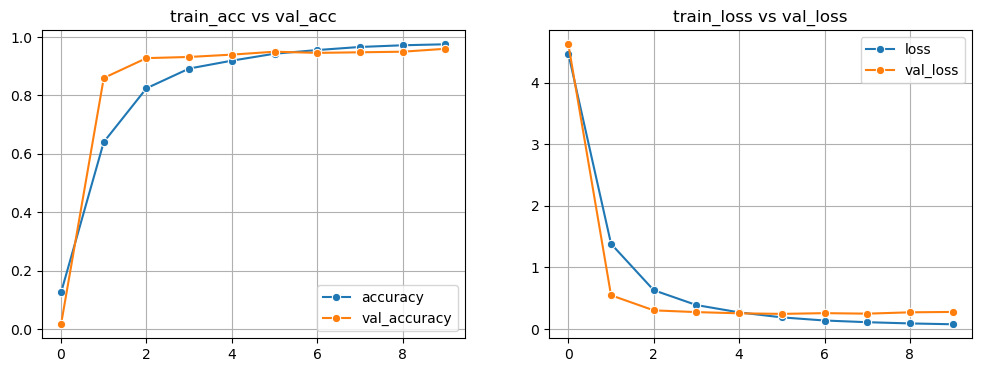

In [20]:
fig, axes = plt.subplots(1,2, figsize=(12,4))
sns.lineplot(data=history.history['accuracy'], ax=axes[0], label='accuracy', marker='o')
sns.lineplot(data=history.history['val_accuracy'], ax=axes[0], label='val_accuracy', marker='o')

sns.lineplot(data=history.history['loss'], ax=axes[1], label='loss', marker='o')
sns.lineplot(data=history.history['val_loss'], ax=axes[1], label='val_loss', marker='o')

axes[0].set_title('train_acc vs val_acc')
axes[1].set_title('train_loss vs val_loss')

axes[0].grid(True)
axes[1].grid(True)

plt.legend()
plt.show()

In [16]:
from sklearn.metrics import confusion_matrix, classification_report, recall_score, precision_score, f1_score

In [8]:
test_generator.reset()
pred_probabilities = model.predict(test_generator)

y_pred = np.argmax(pred_probabilities, axis=1)

y_test = test_generator.classes

C:\Users\GF63\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


16/16 ━━━━━━━━━━━━━━━━━━━━ 16s 809ms/step


In [18]:
recall_eff = recall_score(y_test, y_pred, average='macro')
precision_eff = precision_score(y_test, y_pred, average='macro')
f1_score_eff = f1_score(y_test, y_pred, average='macro')

print(f"Precision (Macro Averaging): {precision_eff:.4f}")
print(f"Recall (Macro Averaging): {recall_eff:.4f}")
print(f"f1_score (Macro Averaging): {f1_score_eff:.4f}")

Precision (Macro Averaging): 0.9730
Recall (Macro Averaging): 0.9660
f1_score (Macro Averaging): 0.9652


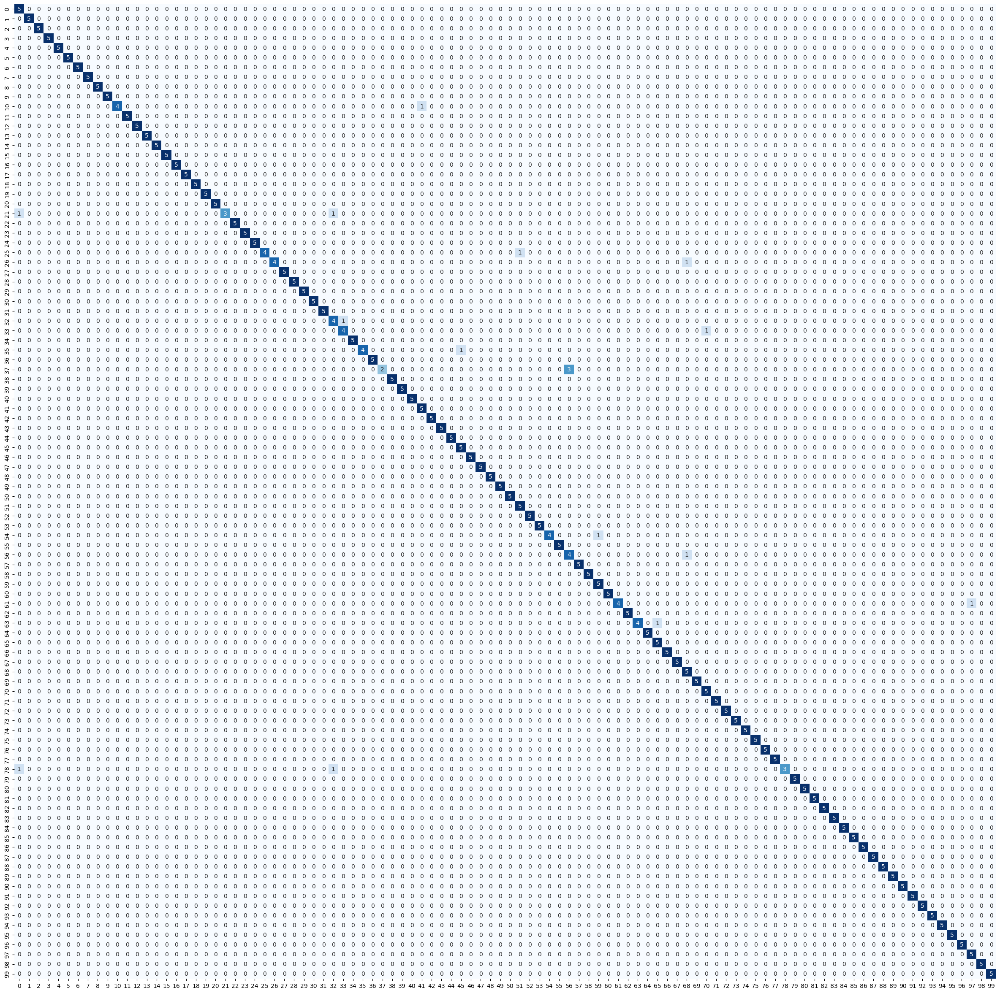

In [23]:
plt.figure(figsize=(30,30))
sns.heatmap(confusion_matrix(y_test,y_pred), annot=True, cbar=False, cmap='Blues')
plt.show()

In [24]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.71      1.00      0.83         5
           1       1.00      1.00      1.00         5
           2       1.00      1.00      1.00         5
           3       1.00      1.00      1.00         5
           4       1.00      1.00      1.00         5
           5       1.00      1.00      1.00         5
           6       1.00      1.00      1.00         5
           7       1.00      1.00      1.00         5
           8       1.00      1.00      1.00         5
           9       1.00      1.00      1.00         5
          10       1.00      0.80      0.89         5
          11       1.00      1.00      1.00         5
          12       1.00      1.00      1.00         5
          13       1.00      1.00      1.00         5
          14       1.00      1.00      1.00         5
          15       1.00      1.00      1.00         5
          16       1.00      1.00      1.00         5
          17       1.00    

## ResNet-50

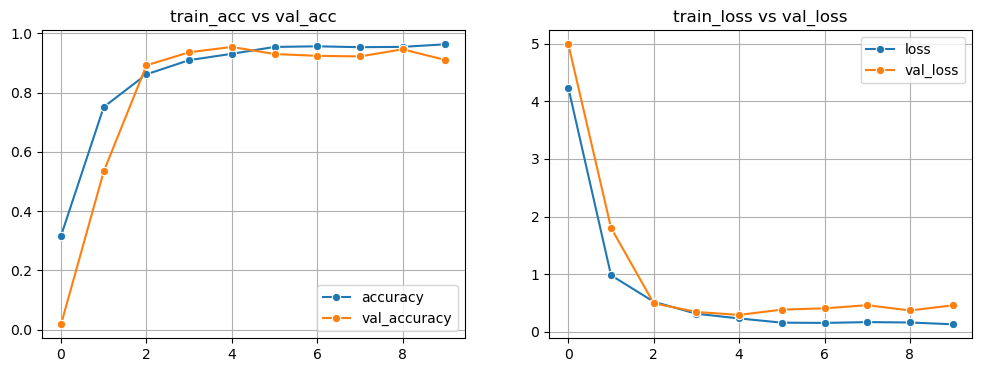

In [21]:
fig, axes = plt.subplots(1,2, figsize=(12,4))
sns.lineplot(data=history2.history['accuracy'], ax=axes[0], label='accuracy', marker='o')
sns.lineplot(data=history2.history['val_accuracy'], ax=axes[0], label='val_accuracy', marker='o')

sns.lineplot(data=history2.history['loss'], ax=axes[1], label='loss', marker='o')
sns.lineplot(data=history2.history['val_loss'], ax=axes[1], label='val_loss', marker='o')

axes[0].set_title('train_acc vs val_acc')
axes[1].set_title('train_loss vs val_loss')

axes[0].grid(True)
axes[1].grid(True)

plt.legend()
plt.show()

In [14]:
test_generator.reset()
pred_probabilities2 = model2.predict(test_generator)

y_pred2 = np.argmax(pred_probabilities2, axis=1)

y_test = test_generator.classes

16/16 ━━━━━━━━━━━━━━━━━━━━ 16s 919ms/step


In [19]:
recall_res = recall_score(y_test, y_pred2, average='macro')
precision_res = precision_score(y_test, y_pred2, average='macro')
f1_score_res = f1_score(y_test, y_pred2, average='macro')


print(f"Precision (Macro Averaging): {precision_res:.4f}")
print(f"Recall (Macro Averaging): {recall_res:.4f}")
print(f"f1_score (Macro Averaging): {f1_score_res:.4f}")

Precision (Macro Averaging): 0.9367
Recall (Macro Averaging): 0.9200
f1_score (Macro Averaging): 0.9178


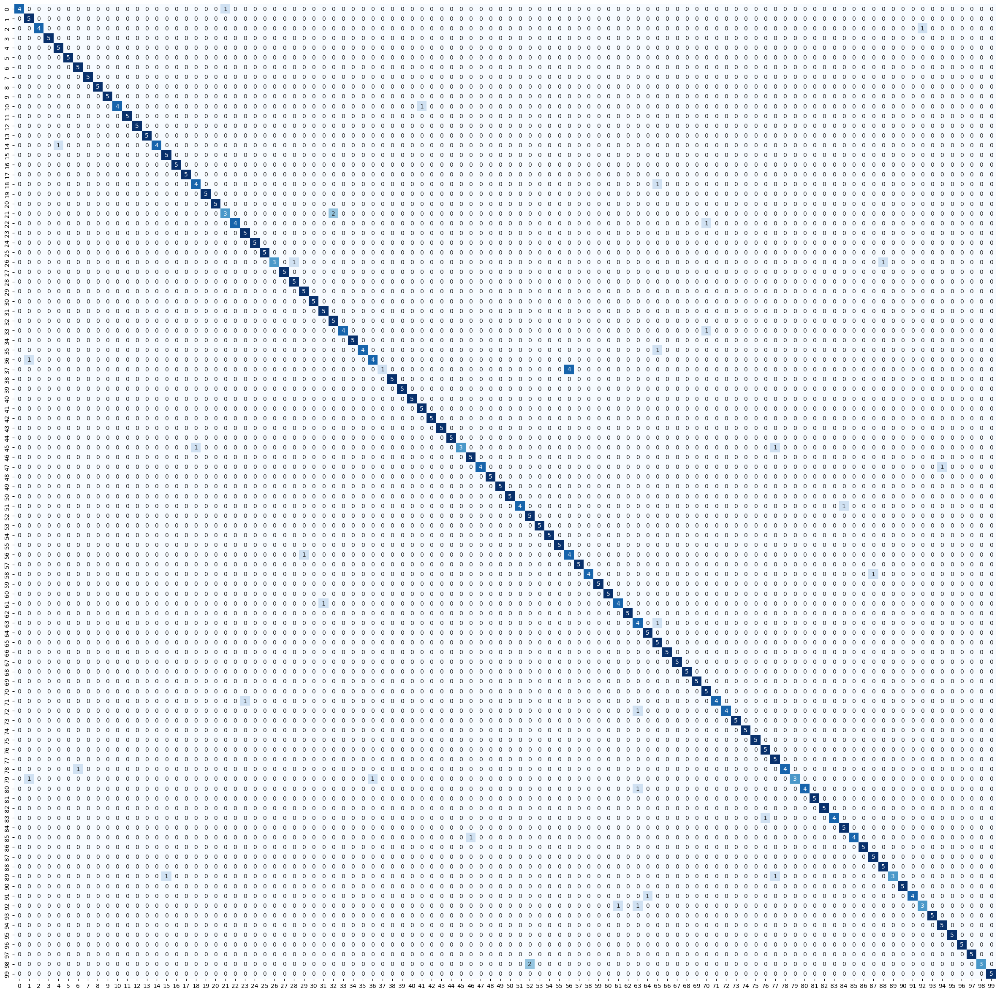

In [24]:
plt.figure(figsize=(30,30))
sns.heatmap(confusion_matrix(y_test,y_pred2), annot=True, cbar=False, cmap='Blues')
plt.show()

In [25]:
print(classification_report(y_test, y_pred2))

              precision    recall  f1-score   support

           0       1.00      0.80      0.89         5
           1       0.71      1.00      0.83         5
           2       1.00      0.80      0.89         5
           3       1.00      1.00      1.00         5
           4       0.83      1.00      0.91         5
           5       1.00      1.00      1.00         5
           6       0.83      1.00      0.91         5
           7       1.00      1.00      1.00         5
           8       1.00      1.00      1.00         5
           9       1.00      1.00      1.00         5
          10       1.00      0.80      0.89         5
          11       1.00      1.00      1.00         5
          12       1.00      1.00      1.00         5
          13       1.00      1.00      1.00         5
          14       1.00      0.80      0.89         5
          15       0.83      1.00      0.91         5
          16       1.00      1.00      1.00         5
          17       1.00    

# Testing

## Efficientnetb3

In [26]:
dict_class = test_generator.class_indices
class_names = list(dict_class.keys())  # storing class/breed names in a list

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


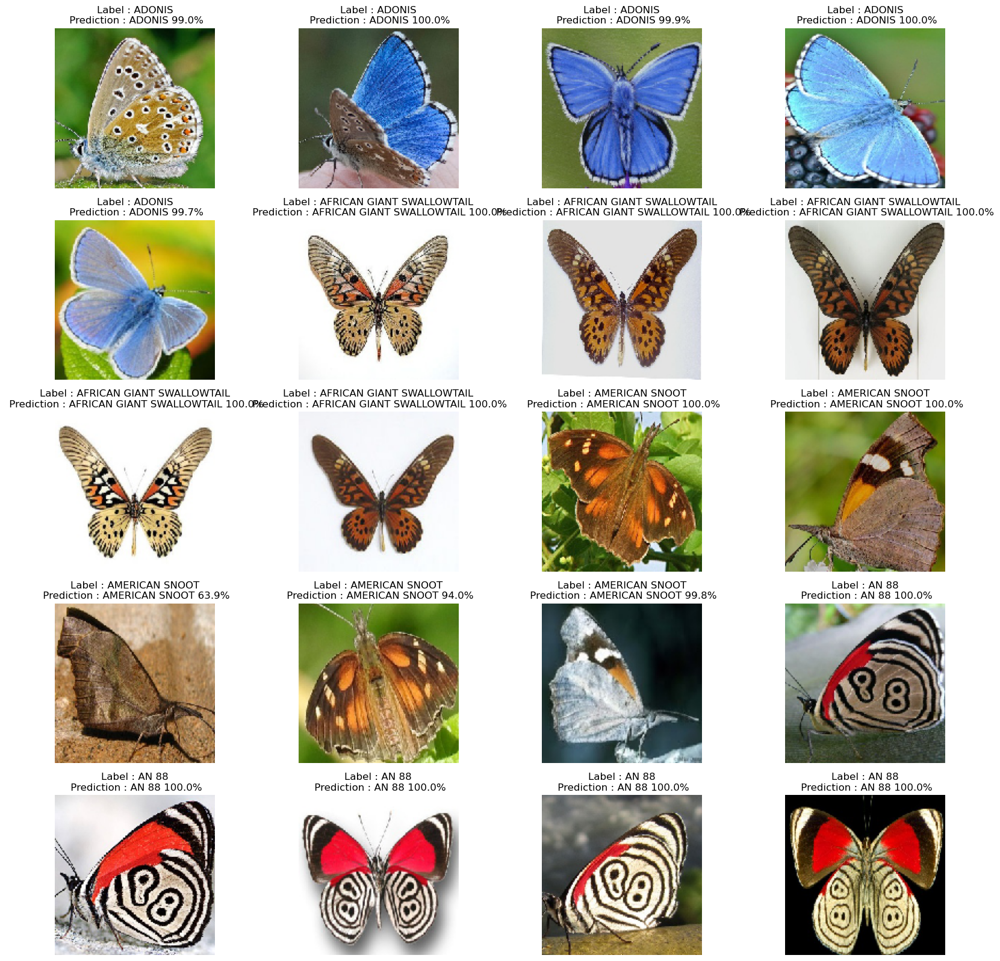

In [28]:
test_generator.reset()
img, label = next(test_generator)

prediction = model.predict(img)
test_pred_classes = np.argmax(prediction, axis=1)

plt.figure(figsize=(20,20))

for i in range(20):
    plt.subplot(5,4,i+1)
    plt.imshow(img[i])
    plt.axis('off')
    plt.title("Label : {}\n Prediction : {} {:.1f}%".format(class_names[np.argmax(label[i])], class_names[test_pred_classes[i]], 100 * np.max(prediction[i])))
plt.show()

## Resnet 50

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


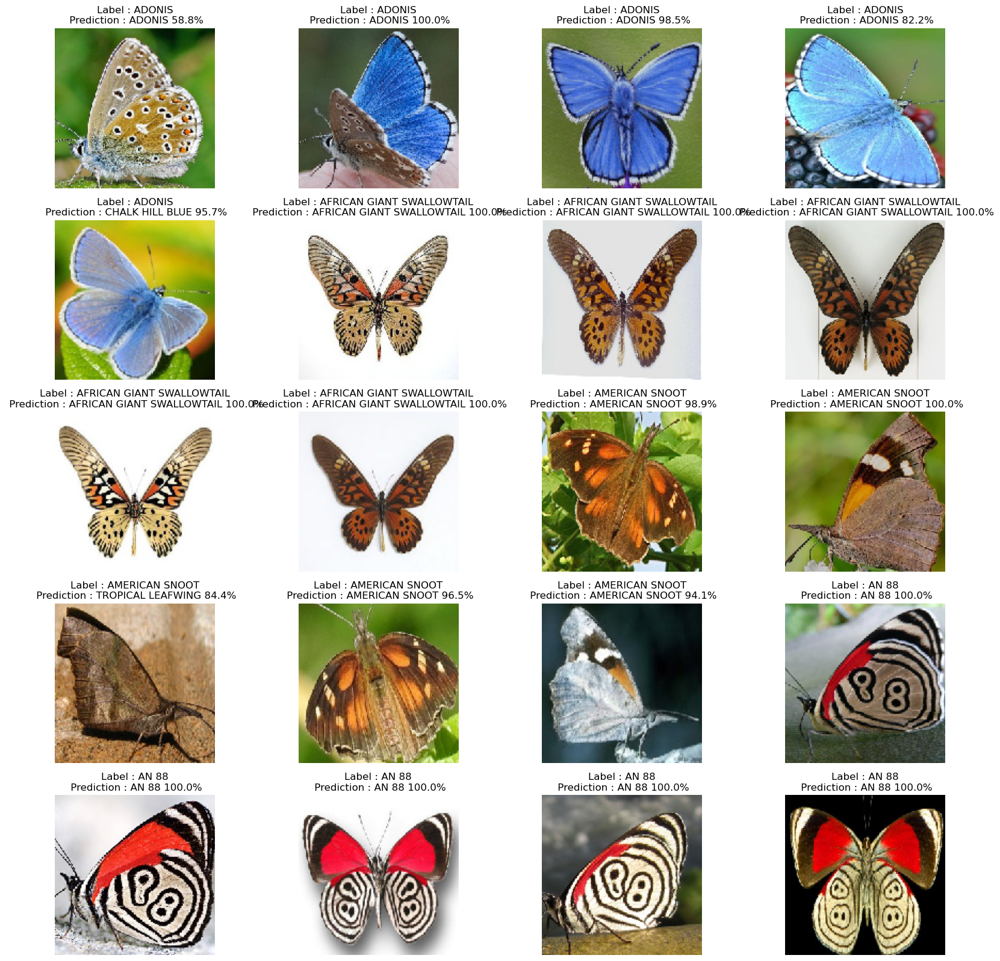

In [29]:
test_generator.reset()
img2, label2 = next(test_generator)

prediction2 = model2.predict(img2)
test_pred_classes2 = np.argmax(prediction2, axis=1)

plt.figure(figsize=(20,20))

for i in range(20):
    plt.subplot(5,4,i+1)
    plt.imshow(img2[i])
    plt.axis('off')
    plt.title("Label : {}\n Prediction : {} {:.1f}%".format(class_names[np.argmax(label2[i])], class_names[test_pred_classes2[i]], 100 * np.max(prediction2[i])))
plt.show()

# Save Model

In [30]:
model.save('best_butterflye3.h5')

In [30]:
model2.save('resnet50.h5')

In [32]:
import pickle 

In [32]:
with open('class_names.pkl', 'wb') as f:
    pickle.dump(class_names, f)

In [34]:
with open('trainHistoryDict', 'wb') as f:
    pickle.dump(history.history, f)

In [33]:
with open('trainHistoryDictResnet', 'wb') as f:
    pickle.dump(history2.history, f)

# Conclusion

The best model for this project is Efficientnetb3 with 97% accuracy compared with resnet 50 with 92% accuracy. Which is reasonable because efficientnet is an advance model of resnet 50. where efficientnet adopted residual connection too but with some improvement architectural, making it more efficient and accurate.